<span style="font-family: Arial; font-weight:bold;font-size:2.5em;color:#00b3e5;"> Advanced Computer Vision

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">  Part1

**DOMAIN: Entertainment**

**• CONTEXT:** Company X owns a movie application and repository which caters movie streaming to millions of users who on subscription basis.
Company wants to automate the process of cast and crew information in each scene from a movie such that when a user pauses on the
movie and clicks on cast information button, the app will show details of the actor in the scene. Company has an in-house computer vision
and multimedia experts who need to detect faces from screen shots from the movie scene.

**• DATA DESCRIPTION:** The dataset comprises of images and its mask where there is a human face.

**• PROJECT OBJECTIVE:** Face detection from training images.

In [1]:
from google.colab import drive


In [2]:
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
%tensorflow_version 2.x
import tensorflow
tensorflow.__version__

'2.6.0'

In [4]:
import random
random.seed(0)

# Ignore the warnings
import warnings
warnings.filterwarnings("ignore")

Importing the Libraries

In [5]:
import os
import numpy as np
import pandas as pd
import cv2
from glob import glob
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import Conv2D, Activation, BatchNormalization
from tensorflow.keras.layers import UpSampling2D, Input, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.metrics import Recall, Precision
from tensorflow.keras import backend as K
from PIL import Image
from numpy import asarray

In [28]:
pathtotrain1 = '/content/gdrive/MyDrive/GL_Projects/Computer_Vision_2/Project1/Part 1- Train data - images.npy'

pathtotest1 = '/content/gdrive/MyDrive/GL_Projects/Computer_Vision_2/Project1'  # Part 1Test Data - Prediction Image.jpeg 

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">1)  Import Data

A NPY file is a NumPy array file created by the Python software package with the NumPy library installed. It contains an array saved in the NumPy (NPY) file format. NPY files store all the information required to reconstruct an array on any computer, which includes dtype and shape information.

In [7]:
data_array = np.load(pathtotrain1, allow_pickle=True)

In [8]:
print(data_array)

[[array([[[42, 37, 34],
        [56, 51, 48],
        [71, 66, 63],
        ...,
        [23, 33, 34],
        [26, 36, 37],
        [28, 38, 39]],

       [[40, 35, 32],
        [51, 46, 43],
        [64, 59, 56],
        ...,
        [27, 36, 35],
        [24, 33, 32],
        [26, 35, 34]],

       [[43, 38, 35],
        [51, 46, 43],
        [61, 56, 53],
        ...,
        [28, 30, 27],
        [33, 35, 32],
        [35, 37, 34]],

       ...,

       [[56, 47, 40],
        [57, 48, 41],
        [61, 52, 45],
        ...,
        [67, 48, 42],
        [55, 35, 28],
        [60, 40, 33]],

       [[53, 44, 37],
        [54, 45, 38],
        [57, 48, 41],
        ...,
        [59, 40, 34],
        [60, 40, 33],
        [54, 34, 27]],

       [[53, 44, 37],
        [54, 45, 38],
        [57, 48, 41],
        ...,
        [59, 40, 34],
        [70, 50, 43],
        [64, 44, 37]]], dtype=uint8)
  list([{'label': ['Face'], 'notes': '', 'points': [{'x': 0.08615384615384615, 'y': 0.3063

In [9]:
data_array.shape

(409, 2)

Array consists of 409 images data and their lables

Lets check first image information

In [10]:
data_array[0][0] # first image first column information

array([[[42, 37, 34],
        [56, 51, 48],
        [71, 66, 63],
        ...,
        [23, 33, 34],
        [26, 36, 37],
        [28, 38, 39]],

       [[40, 35, 32],
        [51, 46, 43],
        [64, 59, 56],
        ...,
        [27, 36, 35],
        [24, 33, 32],
        [26, 35, 34]],

       [[43, 38, 35],
        [51, 46, 43],
        [61, 56, 53],
        ...,
        [28, 30, 27],
        [33, 35, 32],
        [35, 37, 34]],

       ...,

       [[56, 47, 40],
        [57, 48, 41],
        [61, 52, 45],
        ...,
        [67, 48, 42],
        [55, 35, 28],
        [60, 40, 33]],

       [[53, 44, 37],
        [54, 45, 38],
        [57, 48, 41],
        ...,
        [59, 40, 34],
        [60, 40, 33],
        [54, 34, 27]],

       [[53, 44, 37],
        [54, 45, 38],
        [57, 48, 41],
        ...,
        [59, 40, 34],
        [70, 50, 43],
        [64, 44, 37]]], dtype=uint8)

In [11]:
data_array[0][1] # first image second column information

[{'imageHeight': 333,
  'imageWidth': 650,
  'label': ['Face'],
  'notes': '',
  'points': [{'x': 0.08615384615384615, 'y': 0.3063063063063063},
   {'x': 0.1723076923076923, 'y': 0.45345345345345345}]},
 {'imageHeight': 333,
  'imageWidth': 650,
  'label': ['Face'],
  'notes': '',
  'points': [{'x': 0.583076923076923, 'y': 0.2912912912912913},
   {'x': 0.6584615384615384, 'y': 0.46846846846846846}]}]

Dsiplay first 30 images

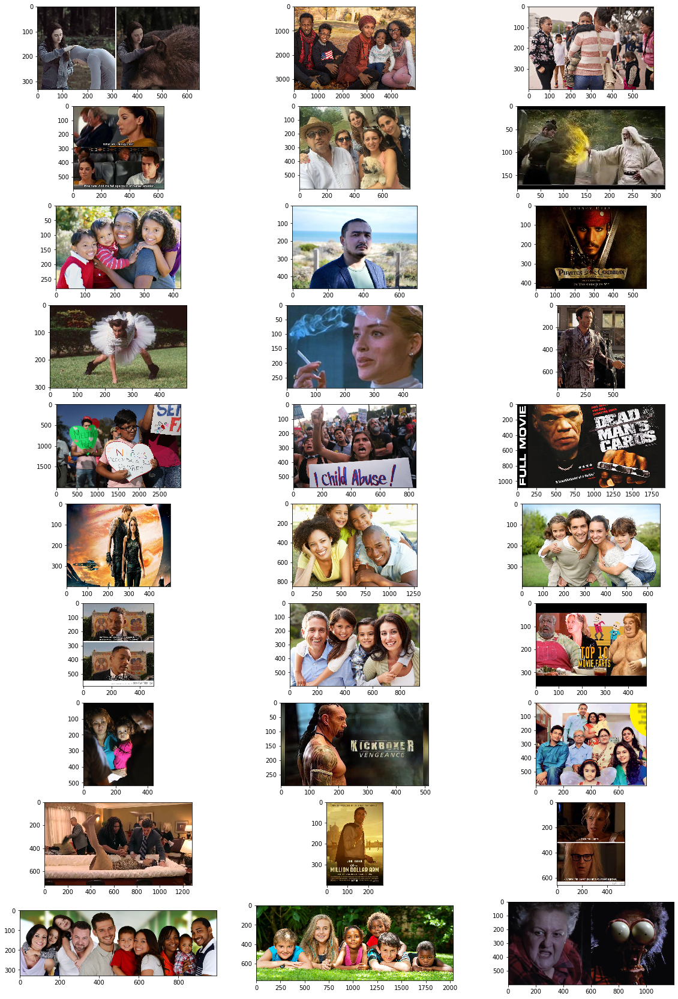

In [12]:
from matplotlib import pyplot as plt
fi,ax = plt.subplots(10,3,figsize=(20,30))
row = 0
col = 0
index = 0
for i in range(30):
  ax[row][col].imshow(data_array[index][0], interpolation='nearest')
  index = index + 12
  col = col + 1
  if col > 2:
    row = row + 1
    col = 0
plt.show()

**Images are of different sizes.**

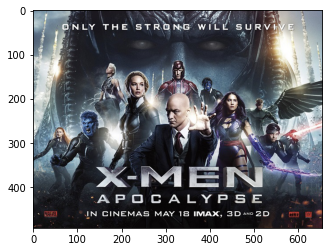

In [13]:
 
 plt.imshow(data_array[408][0])

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">2. Create features (images) and labels (mask)

In [14]:
from tensorflow.keras.applications.mobilenet import preprocess_input
import cv2
IMAGE_HEIGHT = 224
IMAGE_WIDTH = 224

HEIGHT_CELLS = 28
WIDTH_CELLS = 28

IMAGE_SIZE = 224
# The np.zeros() function is used to get a new array of given shape and type, filled with zeros.
masks = np.zeros((int(data_array.shape[0]), IMAGE_HEIGHT, IMAGE_WIDTH))
X = np.zeros((int(data_array.shape[0]),IMAGE_HEIGHT, IMAGE_WIDTH, 3))

for index in range(data_array.shape[0]):
  img = data_array[index][0]
  img = cv2.resize(img, dsize=(IMAGE_HEIGHT, IMAGE_WIDTH), interpolation=cv2.INTER_CUBIC)
  # assign all pixels in the first 3 channels only to the image, i.e., discard the alpha channel
  try:
    img = img[:,:,:3]
  except:
    print(f"Exception {index} Grayscale image with shape {img.shape}")
    # convert the grayscale image to color so that the number of channels are standardized to 3
    img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    continue
  X[index] = preprocess_input(np.array(img, dtype=np.float32))
  # Loop through the face co-ordinates and create mask out of it.
  for i in data_array[index][1]:
    x1 = int(i['points'][0]['x'] * IMAGE_WIDTH)
    x2 = int(i['points'][1]['x'] * IMAGE_WIDTH)
    y1 = int(i['points'][0]['y'] * IMAGE_HEIGHT)
    y2 = int(i['points'][1]['y'] * IMAGE_HEIGHT)
    # set all pixels within the mask co-ordinates to 1.
    masks[index][y1:y2, x1:x2] = 1
print(f"### Shape of X is '{X.shape}' and the shape of mask is '{masks.shape}' ")


Exception 272 Grayscale image with shape (224, 224)
### Shape of X is '(409, 224, 224, 3)' and the shape of mask is '(409, 224, 224)' 


Splitting the data into train and test sets

In [15]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, masks, test_size=0.3)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.2)

print(f"Shape of X_train is '{X_train.shape}' and the shape of y_train is '{y_train.shape}'")
print(f"Shape of X_val is '{X_val.shape}' and the shape of y_val is '{y_val.shape}'")
print(f"Shape of X_test is '{X_test.shape}' and the shape of y_test is '{y_test.shape}'")

Shape of X_train is '(286, 224, 224, 3)' and the shape of y_train is '(286, 224, 224)'
Shape of X_val is '(98, 224, 224, 3)' and the shape of y_val is '(98, 224, 224)'
Shape of X_test is '(25, 224, 224, 3)' and the shape of y_test is '(25, 224, 224)'


Visualizing X_train and y_train images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


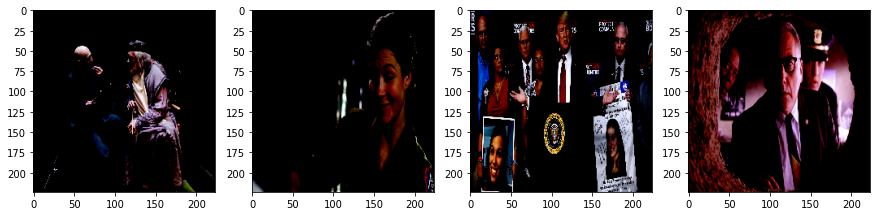

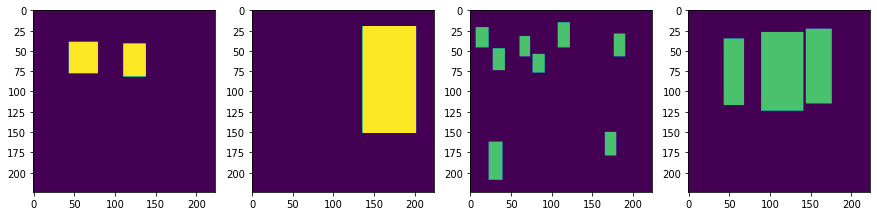

In [16]:
fig = plt.figure(figsize=(15, 15))
a = fig.add_subplot(1, 4, 1)
imgplot = plt.imshow(X_train[0])

a = fig.add_subplot(1, 4, 2)
imgplot = plt.imshow(X_train[10])
imgplot.set_clim(0.0, 0.7)

a = fig.add_subplot(1, 4, 3)
imgplot = plt.imshow(X_train[20])
imgplot.set_clim(0.0, 1.4)

a = fig.add_subplot(1, 4, 4)
imgplot = plt.imshow(X_train[30])
imgplot.set_clim(0.0, 2.1)

fig = plt.figure(figsize=(15, 15))
a = fig.add_subplot(1, 4, 1)
imgplot = plt.imshow(y_train[0])

a = fig.add_subplot(1, 4, 2)
imgplot = plt.imshow(y_train[10])
imgplot.set_clim(0.0, 0.7)

a = fig.add_subplot(1, 4, 3)
imgplot = plt.imshow(y_train[20])
imgplot.set_clim(0.0, 1.4)

a = fig.add_subplot(1, 4, 4)
imgplot = plt.imshow(y_train[30])
imgplot.set_clim(0.0, 1.4)

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">3. Mask detection model:

● Design a face mask detection model using U-net along with mobile net Transfer learning model

What is U-net : 

U-Net architecture is a fully convolutional neural notwork used for semantic segmentation.This architecture consists of two paths, encoder and decoder.

Encoder is used for downsampling to extract features. It is just stack of convolution and maxpooling. 

Decoder is an unsampling part and uses transposed convolution to permit localization.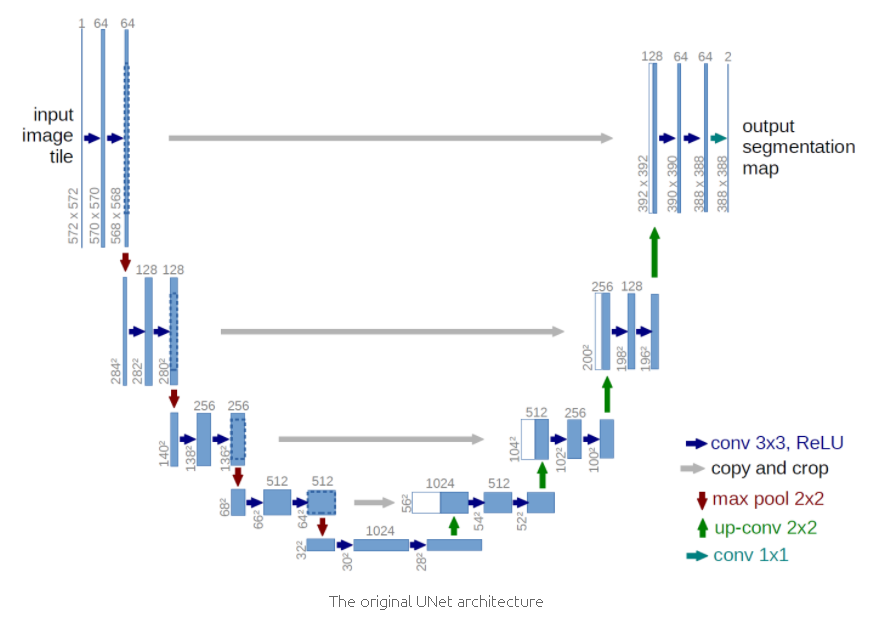


What is MobileNet : 

MobileNetV2 is an architecture that is optimized for mobile devices. It improves the state of the art performance of mobile models on multiple tasks and benchmarks as well as across a spectrum of different model sizes.

The MobileNetV2 is used for the encoder/downsampling path of the U-Net (the left half of the U)

**Advantages of using MobileNetV2 as an Encoder**

MobileNetV2 has less parameters, due to which it is easy to train.

Using a pre-trained encoder helps the model to converge much faster in comparison to the non-pretrained model.

A pre-trained encoder helps the model to achieve high performance as compared to a non pre-trained model.

In [17]:
IMAGE_SIZE = 224
EPOCHS = 30
BATCH = 8
LR = 1e-4


In [18]:
def model():
    inputs = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3), name="input_image")
    
    encoder = MobileNetV2(input_tensor=inputs, weights="imagenet", include_top=False, alpha=0.35)
    #encoder.summary()
    skip_connection_names = ["input_image", "block_1_expand_relu", "block_3_expand_relu", "block_6_expand_relu"]
    encoder_output = encoder.get_layer("block_13_expand_relu").output
    # output shape of layer for skip connections are
# 1) input_image = 224*224
# 2) block_1_expand_relu = 112*112
#3) block_3_expand_relu = 56*56
#4) block_6_expand_relu = 28*28
#5) output shape of encoder (block_13_expand_relu) = 14*14 below
    f = [16, 32, 48, 64]
    x = encoder_output
    for i in range(1, len(skip_connection_names)+1, 1):
        x_skip = encoder.get_layer(skip_connection_names[-i]).output
        x = UpSampling2D((2, 2))(x)
        x = Concatenate()([x, x_skip])
        
        x = Conv2D(f[-i], (3, 3), padding="same")(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)
        
        x = Conv2D(f[-i], (3, 3), padding="same")(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)
        
    x = Conv2D(1, (1, 1), padding="same")(x)
    x = Activation("sigmoid")(x)
    
    model = Model(inputs, x)
    return model

The model function is used to build the architecture for the UNet with pre-trained MobileNetV2.

In [19]:
model = model()
model.summary()

2031616/2019640 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 16) 432         input_image[0][0]                
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 16) 64          Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 112, 112, 16) 0           bn_Conv1[0][0]                   
_______________________________

Designing Dice Coefficient and Loss function

Here, we define the dice coefficient which is used as the metric to measure the performance and the dice coefficient loss.

In [20]:
smooth = 1e-15
def dice_coef(y_true, y_pred):
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

Compliling the Model

In [21]:
opt = tf.keras.optimizers.Nadam(LR)
metrics = [dice_coef, Recall(), Precision()]
model.compile(loss=dice_loss, optimizer=opt, metrics=metrics)

Below callbacks are used while training a network. We used two callbacks:

ReduceLROnPlateau: Reduce learning when a monitored metric has stopped improving.

EarlyStopping: Stop training when a monitored metric has stopped improving.

In [22]:
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=4),
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=False)
]

First we define the training and validation steps, which define the number of batches in an epoch. 

In [23]:
train_steps = len(X_train)//BATCH
valid_steps = len(X_val)//BATCH

if len(X_train) % BATCH != 0:
    train_steps += 1
if len(X_val) % BATCH != 0:
    valid_steps += 1

model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=EPOCHS,
    steps_per_epoch=train_steps,
    validation_steps=valid_steps,
    callbacks=callbacks)

Epoch 1/30
36/36 [==============================] - 127s 3s/step - loss: 0.7246 - dice_coef: 0.2758 - recall: 0.7647 - precision: 0.2087 - val_loss: 0.7153 - val_dice_coef: 0.2958 - val_recall: 0.9991 - val_precision: 0.1423
Epoch 2/30
36/36 [==============================] - 111s 3s/step - loss: 0.6236 - dice_coef: 0.3765 - recall: 0.9065 - precision: 0.3529 - val_loss: 0.7057 - val_dice_coef: 0.3063 - val_recall: 0.9971 - val_precision: 0.1577
Epoch 3/30
36/36 [==============================] - 118s 3s/step - loss: 0.5803 - dice_coef: 0.4195 - recall: 0.9146 - precision: 0.4361 - val_loss: 0.6835 - val_dice_coef: 0.3284 - val_recall: 0.9862 - val_precision: 0.1945
Epoch 4/30
36/36 [==============================] - 120s 3s/step - loss: 0.5490 - dice_coef: 0.4521 - recall: 0.9118 - precision: 0.4846 - val_loss: 0.6664 - val_dice_coef: 0.3455 - val_recall: 0.9816 - val_precision: 0.2250
Epoch 5/30
36/36 [==============================] - 114s 3s/step - loss: 0.5301 - dice_coef: 0.4688 

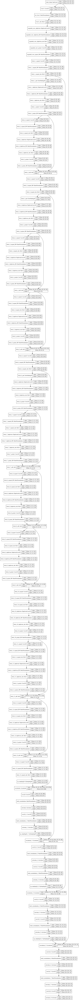

In [24]:
import tensorflow as tf
tf.keras.utils.plot_model(model, show_shapes=True)

Evaluating the Model

In [25]:
test_steps = (len(X_test)//BATCH)
if len(X_test) % BATCH != 0:
    test_steps += 1

model.evaluate(X_test, y_test, steps=test_steps)

4/4 [==============================] - 2s 447ms/step - loss: 0.5304 - dice_coef: 0.4709 - recall: 0.5991 - precision: 0.6065


[0.5304334163665771,
 0.47094225883483887,
 0.5991380214691162,
 0.6065046191215515]

The model has precision and recall of 71.3% and 60.65% respectively. The loss is 44.75% and dice coefficient is 54.32%

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Predicting an image that was not used for training and testing the model

In [29]:
filename = os.path.join(pathtotest1,'Part_1_Test_Data_Prediction_Image.jpeg')
unscaled = cv2.imread(filename)
image = cv2.resize(unscaled, (IMAGE_WIDTH, IMAGE_HEIGHT))
feat_scaled = preprocess_input(np.array(image, dtype=np.float32))

In [30]:
feat_scaled

array([[[ 0.5686275 ,  0.4666667 ,  0.45098042],
        [ 0.56078434,  0.45882356,  0.4431373 ],
        [ 0.5764706 ,  0.47450984,  0.45882356],
        ...,
        [-0.17647058, -0.5058824 , -0.73333335],
        [-0.27058822, -0.49019605, -0.75686276],
        [-0.27843136, -0.47450978, -0.7411765 ]],

       [[ 0.6       ,  0.49803925,  0.48235297],
        [ 0.6       ,  0.4901961 ,  0.48235297],
        [ 0.6313726 ,  0.5294118 ,  0.5137255 ],
        ...,
        [-0.20784312, -0.52156866, -0.7490196 ],
        [-0.16862744, -0.40392154, -0.6627451 ],
        [-0.19215685, -0.41176468, -0.6784314 ]],

       [[ 0.54509807,  0.45098042,  0.41960788],
        [ 0.47450984,  0.3803922 ,  0.34901965],
        [ 0.5372549 ,  0.4431373 ,  0.4039216 ],
        ...,
        [-0.14509803, -0.42745095, -0.6627451 ],
        [-0.3098039 , -0.5686275 , -0.827451  ],
        [-0.34117645, -0.5921569 , -0.8509804 ]],

       ...,

       [[-1.        , -1.        , -1.        ],
        [-1

In [31]:
y_pred = model.predict(np.array([feat_scaled]))
y_pred

array([[[[0.29791605],
         [0.15790033],
         [0.12525138],
         ...,
         [0.1081627 ],
         [0.12435594],
         [0.22812685]],

        [[0.13430217],
         [0.06730932],
         [0.07235149],
         ...,
         [0.05871287],
         [0.05509624],
         [0.0798631 ]],

        [[0.12429267],
         [0.07602167],
         [0.07104751],
         ...,
         [0.05706087],
         [0.04939356],
         [0.05541778]],

        ...,

        [[0.08209991],
         [0.07623005],
         [0.07029924],
         ...,
         [0.06736392],
         [0.06616914],
         [0.06083906]],

        [[0.11751148],
         [0.08811009],
         [0.0900456 ],
         ...,
         [0.06754518],
         [0.05239069],
         [0.08738914]],

        [[0.26397136],
         [0.14446235],
         [0.09494203],
         ...,
         [0.08758512],
         [0.09881282],
         [0.17636323]]]], dtype=float32)

In [32]:
pred_mask = cv2.resize((1.0*(y_pred[0] > 0.5)), (IMAGE_WIDTH,IMAGE_HEIGHT))

Viewing the predicted image and its face-detected output

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


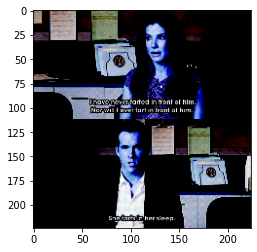

In [33]:
plt.imshow(feat_scaled)

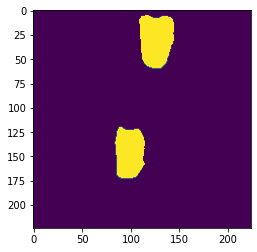

In [34]:
plt.imshow(pred_mask)

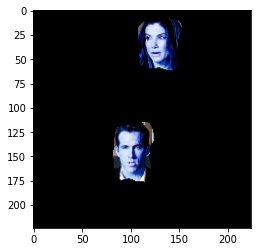

In [ ]:
image2 = image
image2[:,:,0] = pred_mask*image[:,:,0]
image2[:,:,1] = pred_mask*image[:,:,1]
image2[:,:,2] = pred_mask*image[:,:,2]

out_image = image2

plt.imshow(out_image)

<span style="font-family: Arial; font-weight:bold;font-size:2.5em;color:#00b3e5;">************************** End Of Part- 1 ********************************************

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">  Part2

• DOMAIN: Face recognition
• CONTEXT: Company X intends to build a face identification model to recognise human faces.

• DATA DESCRIPTION: The dataset comprises of images and its mask where there is a human face.

• PROJECT OBJECTIVE: Face Aligned Face Dataset from Pinterest. This dataset contains 10,770 images for 100 people. All images are taken
from 'Pinterest' and aligned using dlib library. Some data samples:


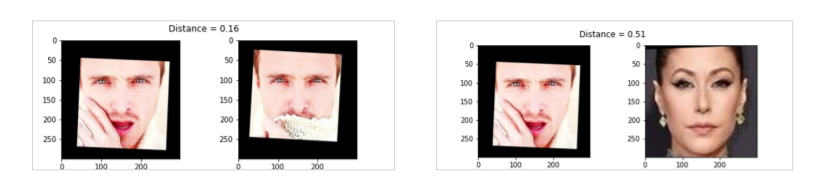

• TASK: In this problem, we use a pre-trained model trained on Face recognition to recognise similar faces. Here, we are particularly interested in recognising whether two given faces are of the same person or not. Below are the steps involved in the project.

• Load the dataset and create the metadata.

• Check some samples of metadata.

• Load the pre-trained model and weights.

• Generate Embedding vectors for each face in the dataset.

• Build distance metrics for identifying the distance between two given images.
• Use PCA for dimensionality reduction.

• Build an SVM classifier in order to map each image to its right person.

• Import the the test image. Display the image. Use the SVM trained model to predict the face

In [10]:
from google.colab import drive

In [11]:
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [12]:
import random
random.seed(0)

# Ignore the warnings
import warnings
warnings.filterwarnings("ignore")

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import cv2
from PIL import Image
from numpy import asarray
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import ZeroPadding2D,Convolution2D,MaxPooling2D
from tensorflow.keras.layers import Dense,Dropout,Softmax,Flatten,Activation,BatchNormalization
from tensorflow.keras.preprocessing.image import load_img,img_to_array
from tensorflow.keras.applications.imagenet_utils import preprocess_input
import tensorflow.keras.backend as K
from sklearn.model_selection import train_test_split


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Load the dataset and create the metadata

Change current working directory to project folder

In [14]:
import os
os.chdir('/content/gdrive/MyDrive/GL_Projects/Computer_Vision_2/Project2')

Unzipping the file : 

Extract Aligned Face Dataset from Pinterest.zip

In [15]:
project_path = '/content/gdrive/MyDrive/GL_Projects/Computer_Vision_2/Project2'

In [16]:

from zipfile import ZipFile

# specifying the zip file name
file_name = os.path.join(project_path,"Part 3 - Aligned Face Dataset from Pinterest.zip")
  
# opening the zip file in READ mode
with ZipFile(file_name, 'r') as zip:
    # printing all the contents of the zip file
    # zip.printdir()
  
    # extracting all the files
    print('Extracting all the files now...')
    zip.extractall()
    print('Done!')

Extracting all the files now...
Done!


### Function to load images
- Define a function to load the images from the extracted folder and map each image with person id 

Renaming the images and extracting only the person's name

In [17]:
directory = '/content/gdrive/MyDrive/GL_Projects/Computer_Vision_2/Project2/pins/PINS'

In [18]:
for filename in os.listdir(directory):
    os.rename(os.path.join(directory,filename),os.path.join(directory, filename.replace(' ', '_').upper()))
    #str = "pins_"
    #if str in filename:    
        #filepath = os.path.join(directory, filename)
        #newfilepath = os.path.join(directory, filename.replace(str, ""))
        #os.rename(filepath, newfilepath)

for subdir, dirs, files in os.walk(directory):
    for file in files:
       os.rename(os.path.join(subdir, file), os.path.join(subdir, file.replace(' ', '_')))

In [19]:
for filename in os.listdir(directory):
    str = "PINS_"
    if str in filename:    
        filepath = os.path.join(directory, filename)
        newfilepath = os.path.join(directory, filename.replace(str, ""))
        os.rename(filepath, newfilepath)

Dsiplay all the lables

In [20]:
import glob

paths = glob.glob("pins/PINS/*")
label_names = [os.path.split(x)[1] for x in paths]

print("Total labels: {}".format(len(label_names)))
print("Labels: {}".format((label_names)))

Total labels: 100
Labels: ['AARON_PAUL', 'ALVARO_MORTE', 'AMANDA_CREW', 'AMAURY_NOLASCO', 'ANNA_GUNN', 'BENEDICT_CUMBERBATCH', 'BETSY_BRANDT', 'BRENTON_THWAITES', 'BRIT_MARLING', 'BRYAN_CRANSTON', 'CAITY_LOTZ', 'CAMERON_MONAGHAN', 'CHANCE_PERDOMO', 'CHRIS_EVANS', 'CHRIS_PRATT', 'COBIE_SMULDERS', 'DANIELLE_PANABAKER', 'DAVE_FRANCO', 'DOMINIC_PURCELL', 'DWAYNE_JOHNSON', 'EMILIA_CLARKE', 'EMILY_BETT_RICKARDS', 'EMMA_STONE', 'GWYNETH_PALTROW', 'HENRY_CAVIL', 'JASON_MOMOA', 'JEREMY_RENNER', 'JESSE_EISENBERG', 'JIM_PARSONS', 'JON_BERNTHAL', 'JOSH_RADNOR', 'KIT_HARINGTON', 'KRYSTEN_RITTER', 'KUMAIL_NANJIANI', 'MAISIE_WILLIAMS', 'MARK_RUFFALO', 'MARTIN_STARR', 'MELISSA_BENOIT', 'MIKE_COLTER', 'MORENA_BACCARIN', 'MORGAN_FREEMAN', 'NATALIE_PORTMAN_', 'NEIL_PATRICK_HARRIS', 'PAUL_RUDD', 'PEDRO_ALONSO', 'PETER_DINKLAGE', 'RJ_MITTE', 'RAMI_MELEK', 'ROBERT_KNEPPER', 'ROBIN_TAYLOR', 'RYAN_REYNOLDS', 'SARAH_WAYNE_CALLIES', 'SCARLETT_JOHANSSON', 'SEBASTIAN_STAN', 'SOPHIE_TURNER', 'STEPHEN_AMELL', 'SUND

Saving the metadata in a dataframe

In [21]:
df = pd.DataFrame(columns=['Person', 'No. of Images','File Path', 'Files'])

folders = [x[0] for x in os.walk(directory)]

for subfolders in folders:
  fileList = os.listdir(subfolders)
  filePath = os.path.abspath(subfolders)
  person = (subfolders)[len(directory):]
  df = df.append({'Person': person, 'No. of Images': len(fileList), 'File Path': filePath , 'Files': fileList}, ignore_index=True)

df

,Person,No. of Images,File Path,Files
0,,100,/content/gdrive/MyDrive/GL_Projects/Computer_V...,"[AARON_PAUL, ALVARO_MORTE, AMANDA_CREW, AMAURY..."
1,/AARON_PAUL,86,/content/gdrive/MyDrive/GL_Projects/Computer_V...,"[Aaron_Paul0_262.jpg, Aaron_Paul101_247.jpg, A..."
2,/ALVARO_MORTE,91,/content/gdrive/MyDrive/GL_Projects/Computer_V...,"[Alvaro_Morte100_825.jpg, Alvaro_Morte101_873...."
3,/AMANDA_CREW,118,/content/gdrive/MyDrive/GL_Projects/Computer_V...,"[Amanda_Crew0.jpg, Amanda_Crew1.jpg, Amanda_Cr..."
4,/AMAURY_NOLASCO,113,/content/gdrive/MyDrive/GL_Projects/Computer_V...,"[Amaury_Nolasco0.jpg, Amaury_Nolasco1.jpg, Ama..."
...,...,...,...,...
96,/SHAKIRA,50,/content/gdrive/MyDrive/GL_Projects/Computer_V...,"[shakira0.jpg, shakira1.jpg, shakira10.jpg, sh..."
97,/TATI_GABRIELLE,65,/content/gdrive/MyDrive/GL_Projects/Computer_V...,"[tati_gabrielle0.jpg, tati_gabrielle1.jpg, tat..."
98,/TAYLOR_SWIFT,99,/content/gdrive/MyDrive/GL_Projects/Computer_V...,"[taylor_swift0.jpg, taylor_swift1.jpg, taylor_..."
99,/TOM_HOLLAND_FACE,119,/content/gdrive/MyDrive/GL_Projects/Computer_V...,"[tom_holland_face0.jpg, tom_holland_face1.jpg,..."


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Check some samples of metadata.

Visualizing few images from each label

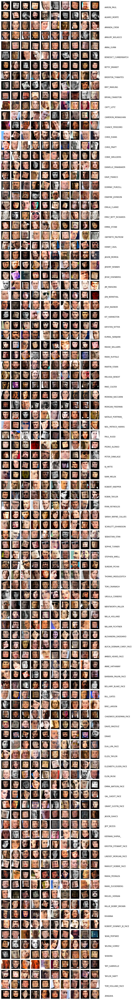

In [22]:
from mpl_toolkits.axes_grid1 import ImageGrid
import glob
fig = plt.figure(1, (300, 100))
grid = ImageGrid(fig, 111, nrows_ncols=(100, 10), axes_pad=0.1)

n_img_class = []
counter = 0
for idx, label in enumerate(label_names):
    paths = glob.glob(os.path.join("pins/PINS", label, "*.jpg"))
    n_img_class.append([label, len(paths)])
    perm = np.random.choice(len(paths), size=10)

    title = True
    for ii in perm:
        ax = grid[counter]
        if title:
            ax.text(1800, 105, label, verticalalignment="center")
            title = False
        img = cv2.imread(paths[ii])
        img = cv2.resize(img, (150, 150))
        ax.axis("off")
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        counter += 1
        
plt.show()

Creating the features and target sets

In [23]:
#save the path into variable to use it easily next times.
TRAIN_FOLDER= "pins/PINS"

In [24]:
from glob import glob
images = []
classes=[]
missing=0
for class_folder_name in os.listdir(TRAIN_FOLDER):
    class_folder_path = os.path.join(TRAIN_FOLDER, class_folder_name)
    class_label = class_folder_name
    
    for image_path in glob(os.path.join(class_folder_path, "*.jpg")):
        image_bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
        if image_bgr is None: # if the file contain any missing value ignore it
          missing += 1
          continue
        images.append(image_bgr)
        
        classes.append(class_label)

In [25]:

len(images)

10770

Performing preprocessing for all the images

In [26]:
# resize image
def resize_images(img):

  img = np.array(img).astype(np.uint8)
  #print(img.dtype)
  res = cv2.resize(img,(224,224), interpolation = cv2.INTER_CUBIC)
  return res

#save resized images into images.
images = [resize_images(img) for img in images]

In [27]:
images[0].shape

(224, 224, 3)

Displaying the shapes of images and classes

In [28]:
#see number of images in each label
images = np.array(images)
classes = np.array(classes)
print("images shape: ", images.shape)
print("classes shape: ", classes.shape)

images shape:  (10770, 224, 224, 3)
classes shape:  (10770,)


sample image

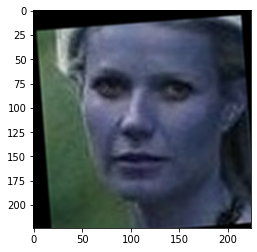

In [79]:
plt.imshow(images[2558])

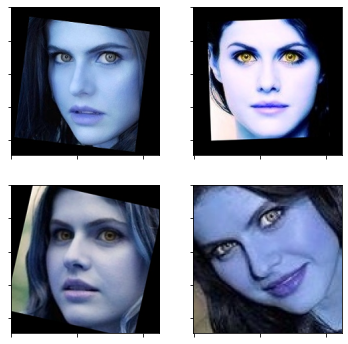

In [68]:
def plot_for_class(label):
    nb_rows = 2
    nb_cols = 2
    fig, axs = plt.subplots(nb_rows, nb_cols, figsize=(6, 6))
    class_images =images[classes== label]
    n = 0
    for i in range(0, nb_rows):
        for j in range(0, nb_cols):
            axs[i, j].xaxis.set_ticklabels([])
            axs[i, j].yaxis.set_ticklabels([])
            axs[i, j].imshow(class_images[n])
            n += 1 
plot_for_class("ALEXANDRA_DADDARIO")

The metadata for each image (file and identity name) are loaded into memory for later processing.

In [30]:
class IdentityMetadata():
    def __init__(self, base, name, file):
        # dataset base directory
        self.base = base
        # identity name
        self.name = name
        # image file name
        self.file = file

    def __repr__(self):
        return self.image_path()

    def image_path(self):
        return os.path.join(self.base, self.name, self.file) 
    
def load_metadata(path):
    metadata = []
    for i in os.listdir(path):
        for f in os.listdir(os.path.join(path, i)):
            metadata.append(IdentityMetadata(path, i, f))
    return np.array(metadata)

metadata = load_metadata(directory)

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Load the pre-trained model and weights

Installing the keras-vggface package

In [31]:
! pip install git+https://github.com/rcmalli/keras-vggface.git
!pip install keras_applications --no-deps
filename = "/usr/local/lib/python3.7/dist-packages/keras_vggface/models.py"
text = open(filename).read()
open(filename, "w+").write(text.replace('keras.engine.topology', 'tensorflow.keras.utils'))
import tensorflow as tf

from keras_vggface.vggface import VGGFace

vggface = VGGFace(model='resnet50') # or VGGFace() as default

  Cloning https://github.com/rcmalli/keras-vggface.git to /tmp/pip-req-build-a22ugf7c
  Running command git clone -q https://github.com/rcmalli/keras-vggface.git /tmp/pip-req-build-a22ugf7c
  Created wheel for keras-vggface: filename=keras_vggface-0.6-py3-none-any.whl size=8325 sha256=c7e8d3a9c760a5cb3e9519c6dd09a2d945031abd97901234e23c409926f04b69
  Stored in directory: /tmp/pip-ephem-wheel-cache-jipux_kp/wheels/08/df/86/0225d44647ab2256dbf1e006823288fe9cc86367a056e6ea2c
Successfully built keras-vggface
     |████████████████████████████████| 50 kB 3.1 MB/s 
165453824/165439116 [==============================] - 3s 0us/step


In [32]:
pip show keras-vggface

Name: keras-vggface
Version: 0.6
Summary: VGGFace implementation with Keras framework
Home-page: https://github.com/rcmalli/keras-vggface
Author: Refik Can MALLI
Author-email: mallir@itu.edu.tr
License: MIT
Location: /usr/local/lib/python3.7/dist-packages
Requires: h5py, pyyaml, pillow, six, scipy, numpy, keras
Required-by: 


In [33]:
# check version of keras_vggface
import keras_vggface
# print version
print(keras_vggface.__version__)

0.6


Loading the pretrained vggface weights

In [34]:
weights_file = project_path + '/Part 3 - vgg_face_weights.h5'

Creating a VGG Face Model

In [35]:


# Define VGG_FACE_MODEL architecture
model = Sequential()
model.add(ZeroPadding2D((1,1),input_shape=(224,224, 3)))
model.add(Convolution2D(64, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))

model.add(ZeroPadding2D((1,1)))	
model.add(Convolution2D(128, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))

model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(256, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(256, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(256, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))

model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))

model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))

model.add(Convolution2D(4096, (7, 7), activation='relu'))
model.add(Dropout(0.5))
model.add(Convolution2D(4096, (1, 1), activation='relu'))
model.add(Dropout(0.5))
model.add(Convolution2D(2622, (1, 1)))
model.add(Flatten())
model.add(Activation('softmax'))

# Load VGG Face model weights
model.load_weights(weights_file)

In [36]:
# Remove last Softmax layer and get model upto last flatten layer #with outputs 2622 units 
vgg_face_descriptor=Model(inputs=model.layers[0].input,outputs=model.layers[-2].output) 

In [80]:
type(vgg_face_descriptor)

keras.engine.functional.Functional

Detecting Faces for Face Recognition

In [37]:
pip install mtcnn

     |████████████████████████████████| 2.3 MB 5.3 MB/s 


In [38]:
# confirm mtcnn was installed correctly
import mtcnn
# print version
print(mtcnn.__version__)

0.1.0


Viewing a sample image

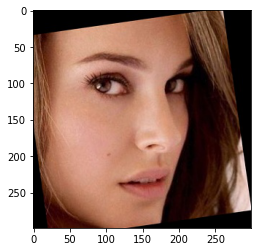

In [39]:
sample_pic = '/content/gdrive/MyDrive/GL_Projects/Computer_Vision_2/Project2/pins/PINS/NATALIE_PORTMAN_/Natalie_Portman_22.jpg'

# load image from file
image = plt.imread(sample_pic)
plt.imshow(image)

Next, initialize an MTCNN() object into the detector variable and use the .detect_faces() method to detect the faces in an image. Let’s see what it returns:

In [40]:
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

In [41]:
from mtcnn.mtcnn import MTCNN

# create the detector, using default weights
detector = MTCNN()
# detect faces in the image
faces = detector.detect_faces(image)
for face in faces:
  print(face)

{'box': [9, 0, 231, 295], 'confidence': 0.9747866988182068, 'keypoints': {'left_eye': (106, 101), 'right_eye': (205, 105), 'nose': (178, 175), 'mouth_left': (112, 231), 'mouth_right': (183, 231)}}


For every face, a Python dictionary is returned, which contains three keys. The box key contains the boundary of the face within the image. It has four values: x- and y- coordinates of the top left vertex, width, and height of the rectangle containing the face. The other keys are confidence and keypoints. The keypoints key contains a dictionary containing the features of a face that were detected, along with their coordinates:

Highlighting Faces in an Image

Now that we’ve successfully detected a face, let’s draw a rectangle over it to highlight the face within the image to verify if the detection was correct.

To draw a rectangle, import the Rectangle object from matplotlib.patches:

In [42]:
from matplotlib.patches import Rectangle

Let’s define a function highlight_faces to first display the image and then draw rectangles over faces that were detected. First, read the image through imread() and plot it through imshow(). For each face that was detected, draw a rectangle using the Rectangle() class.

Finally, display the image and the rectangles using the .show() method. If you’re using Jupyter notebooks, you may use the %matplotlib inline magic command to show plots inline:

In [43]:
def highlight_faces(image_path, faces):
  # display image
    image = plt.imread(image_path)
    plt.imshow(image)

    ax = plt.gca()

    # for each face, draw a rectangle based on coordinates
    for face in faces:
        x, y, width, height = face['box']
        face_border = Rectangle((x, y), width, height,
                          fill=False, color='red')
        ax.add_patch(face_border)
    plt.show()

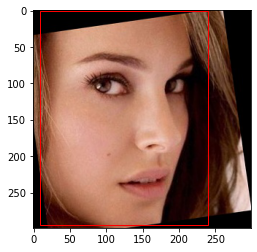

In [44]:
highlight_faces('/content/gdrive/MyDrive/GL_Projects/Computer_Vision_2/Project2/pins/PINS/NATALIE_PORTMAN_/Natalie_Portman_22.jpg', faces)

Let’s display the second image and the face(s) detected in it:

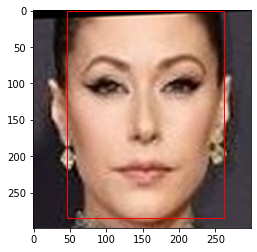

In [45]:
image = plt.imread('/content/gdrive/MyDrive/GL_Projects/Computer_Vision_2/Project2/pins/PINS/AMANDA_CREW/Amanda_Crew100.jpg')
faces = detector.detect_faces(image)

highlight_faces('/content/gdrive/MyDrive/GL_Projects/Computer_Vision_2/Project2/pins/PINS/AMANDA_CREW/Amanda_Crew100.jpg', faces)

In these two images, you can see that the MTCNN algorithm correctly detects faces. Let’s now extract this face from the image to perform further analysis on it.

**Extracting Face for Further Analysis**

At this point, you know the coordinates of the faces from the detector. Extracting the faces is a fairly easy task using list indices. However, the VGGFace2 algorithm that we use needs the faces to be resized to 224 x 224 pixels. We’ll use the PIL library to resize the images.

The function extract_face_from_image() extracts all faces from an image:

In [46]:
# extract a single face from a given photograph
def extract_face(filename, required_size=(224, 224)):
	# load image from file
	pixels = cv2.imread(filename)
 
	# create the detector, using default weights
	detector = MTCNN()
 
	# detect faces in the image
	results = detector.detect_faces(pixels)
 
	# extract the bounding box from the first face
	x1, y1, width, height = results[0]['box']
	x2, y2 = x1 + width, y1 + height

	# extract the face
	face = pixels[y1:y2, x1:x2]

	# resize pixels to the model size
	image = Image.fromarray(face)
	image = image.resize(required_size)
	face_array = asarray(image)
	return face_array

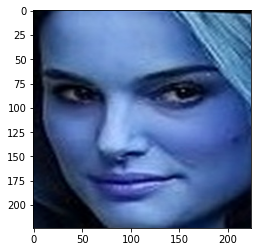

In [47]:
# load the photo and extract the face
pixels = extract_face('/content/gdrive/MyDrive/GL_Projects/Computer_Vision_2/Project2/pins/PINS/NATALIE_PORTMAN_/Natalie_Portman_46.jpg')

# plot the extracted face
plt.imshow(pixels)

# show the plot
plt.show()

In [48]:
pip install keras_vggface

In [49]:
pip install keras_applications

Performing image preprocessing before fed into the VGG Face model

In [50]:
cd '/content/gdrive/MyDrive/GL_Projects/Computer_Vision_2/Project2/pins/PINS'

/content/gdrive/MyDrive/GL_Projects/Computer_Vision_2/Project2/pins/PINS


In [51]:
from numpy import expand_dims
import tensorflow.python.keras.engine
from keras_vggface import utils

# load the photo and extract the face
pixels = extract_face('NATALIE_PORTMAN_/Natalie_Portman_46.jpg')

# convert one face into samples
pixels = pixels.astype('float32')
samples = expand_dims(pixels, axis=0)

# prepare the face for the model, e.g. center pixels
samples =utils.preprocess_input(samples, version=2)

Predicting the label of the sample image

In [52]:
from keras_vggface.utils import decode_predictions

# perform prediction
yhat = vgg_face_descriptor.predict(samples)

# convert prediction into names
results = decode_predictions(yhat)

# display most likely results
for result in results[0]:
	print('%s: %.2f%%' % (result[0], result[1]))

360448/346184 [===============================] - 0s 0us/step
b'Natalie_Portman': 19.45%
b'Jessica_McNamee': 12.00%
b'Mathilda_May': 11.42%
b'Kristina_Anapau': 11.01%
b'Virginie_Ledoyen': 10.97%


The model was able to predict the image correctly as Natalie_Portman but the confidence level is very less with only 19.45%

In [82]:
import cv2
def load_image(path):
    img = cv2.imread(path, 1)
    # OpenCV loads images with color channels
    # in BGR order. So we need to reverse them
    return img[...,::-1]

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Generate Embedding vectors for each face in the dataset

In [83]:
# Get embedding vector for first image in the metadata using the pre-trained model
img_path = metadata[0].image_path()
img = load_image(img_path)

# Normalising pixel values from [0-255] to [0-1]: scale RGB values to interval [0,1]
img = (img / 255.).astype(np.float32)
img = cv2.resize(img, dsize = (224,224))
print(img.shape)

# Obtain embedding vector for an image
# Get the embedding vector for the above image using vgg_face_descriptor model and print the shape 
embedding_vector = vgg_face_descriptor.predict(np.expand_dims(img, axis=0))[0]
print(embedding_vector.shape)

(224, 224, 3)
(2622,)


In [84]:
embedding_vector[0], type(embedding_vector), type(embedding_vector[0])

(0.031703033, numpy.ndarray, numpy.float32)

In [85]:
embedding_vector[2], embedding_vector[98], embedding_vector[-2]

(-0.012434017, -0.008693824, 0.002190803)

In [86]:
total_images = len(metadata)

print('total_images :', total_images)

total_images : 10770


In [87]:
embeddings = np.zeros((metadata.shape[0], 2622))
for i, m in enumerate(metadata):
    img_path = metadata[i].image_path()
    img = load_image(img_path)
    img = (img / 255.).astype(np.float32)
    img = cv2.resize(img, dsize = (224,224))
    embedding_vector = vgg_face_descriptor.predict(np.expand_dims(img, axis=0))[0]
    embeddings[i]=embedding_vector

In [89]:
import pickle
filename = os.path.join(project_path, 'Part 2-embeddings.sav')
pickle.dump(embeddings, open(filename, 'wb'))

In [90]:
embeddings = pickle.load(open(filename, 'rb'))

In [91]:
embeddings[0], embeddings[988], embeddings[988].shape

(array([ 0.03170303, -0.0150513 , -0.01243402, ...,  0.0004314 ,
         0.0021908 , -0.00908097]),
 array([-0.00044258,  0.01825998,  0.01218896, ..., -0.03309939,
         0.01136689,  0.02154323]),
 (2622,))

In [92]:
embeddings[8275]

array([ 0.01786545,  0.00912622,  0.00244407, ..., -0.02196857,
        0.01290169,  0.04220536])

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Build distance metrics for identifying the distance between two given images.

**Defining functions to measure the distance between two different images to find how identical they are**

In [93]:
def distance(emb1, emb2):
    return np.sum(np.square(emb1 - emb2))

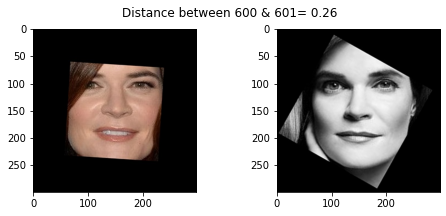

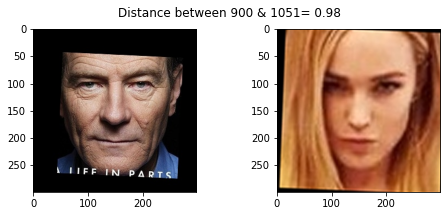

In [98]:
def show_pair(idx1, idx2):
    plt.figure(figsize=(8,3))
    plt.suptitle(f'Distance between {idx1} & {idx2}= {distance(embeddings[idx1], embeddings[idx2]):.2f}')
    plt.subplot(121)
    plt.imshow(load_image(metadata[idx1].image_path()))
    plt.subplot(122)
    plt.imshow(load_image(metadata[idx2].image_path()));    

show_pair(600, 601)
show_pair(900, 1051)

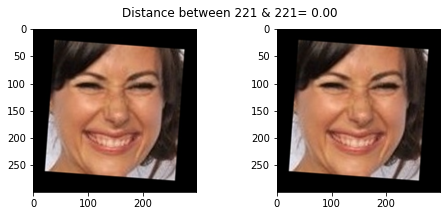

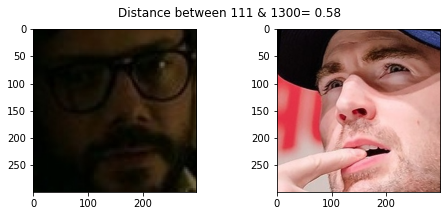

In [101]:
show_pair(221, 221)
show_pair(111, 1300)

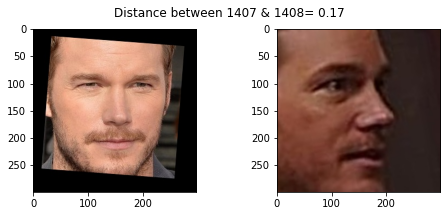

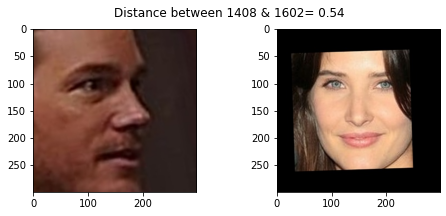

In [102]:
show_pair(1407, 1408)
show_pair(1408, 1602)

**Splitting data into training and testing set**

In [104]:
train_idx = np.arange(metadata.shape[0]) % 9 != 0     #every 9th example goes in test data and rest go in train data
test_idx = np.arange(metadata.shape[0]) % 9 == 0

# one half as train examples of 10 identities
X_train = embeddings[train_idx]

# another half as test examples of 10 identities
X_test = embeddings[test_idx]
targets = np.array([m.name for m in metadata])

#train labels
y_train = targets[train_idx]

#test labels
y_test = targets[test_idx]

In [105]:
print('X_train shape : ({0},{1})'.format(X_train.shape[0], X_train.shape[1]))
print('y_train shape : ({0},)'.format(y_train.shape[0]))
print('X_test shape : ({0},{1})'.format(X_test.shape[0], X_test.shape[1]))
print('y_test shape : ({0},)'.format(y_test.shape[0]))

X_train shape : (9573,2622)
y_train shape : (9573,)
X_test shape : (1197,2622)
y_test shape : (1197,)


In [106]:
y_test[0], y_train[988]

('AARON_PAUL', 'CAMERON_MONAGHAN')

In [107]:
len(np.unique(y_test)), len(np.unique(y_train))

(100, 100)

In [108]:
from sklearn.preprocessing import LabelEncoder
lencode = LabelEncoder()
y_train_encoded = lencode.fit_transform(y_train)


In [109]:
print(lencode.classes_)
y_test_encoded = lencode.transform(y_test)

['AARON_PAUL' 'ALEXANDRA_DADDARIO' 'ALVARO_MORTE'
 'ALYCIA_DEBNAM_CAREY_FACE' 'AMANDA_CREW' 'AMAURY_NOLASCO'
 'AMBER_HEARD_FACE' 'ANNA_GUNN' 'ANNE_HATHAWAY' 'BARBARA_PALVIN_FACE'
 'BELLAMY_BLAKE_FACE' 'BENEDICT_CUMBERBATCH' 'BETSY_BRANDT' 'BILL_GATES'
 'BRENTON_THWAITES' 'BRIE_LARSON' 'BRIT_MARLING' 'BRYAN_CRANSTON'
 'CAITY_LOTZ' 'CAMERON_MONAGHAN' 'CHADWICK_BOSEMAN_FACE' 'CHANCE_PERDOMO'
 'CHRIS_EVANS' 'CHRIS_PRATT' 'COBIE_SMULDERS' 'DANIELLE_PANABAKER'
 'DAVE_FRANCO' 'DAVID_MAZOUZ' 'DOMINIC_PURCELL' 'DRAKE' 'DUA_LIPA_FACE'
 'DWAYNE_JOHNSON' 'ELIZABETH_OLSEN_FACE' 'ELIZA_TAYLOR' 'ELON_MUSK'
 'EMILIA_CLARKE' 'EMILY_BETT_RICKARDS' 'EMMA_STONE' 'EMMA_WATSON_FACE'
 'GAL_GADOT_FACE' 'GRANT_GUSTIN_FACE' 'GWYNETH_PALTROW' 'HENRY_CAVIL'
 'JASON_ISAACS' 'JASON_MOMOA' 'JEFF_BEZOS' 'JEREMY_RENNER'
 'JESSE_EISENBERG' 'JIM_PARSONS' 'JON_BERNTHAL' 'JOSH_RADNOR'
 'KIERNAN_SHIPKA_' 'KIT_HARINGTON' 'KRISTEN_STEWART_FACE' 'KRYSTEN_RITTER'
 'KUMAIL_NANJIANI' 'LINDSEY_MORGAN_FACE' 'MAISIE_WILLIAMS'
 'MAR

In [110]:
print('y_train_encoded : ', y_train_encoded)
print('y_test_encoded : ', y_test_encoded)

y_train_encoded :  [ 0  0  0 ... 99 99 99]
y_test_encoded :  [ 0  0  0 ... 99 99 99]


In [111]:
# Standarize features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)

In [112]:
X_test_std = scaler.transform(X_test)

In [113]:
print('X_train_std shape : ({0},{1})'.format(X_train_std.shape[0], X_train_std.shape[1]))
print('y_train_encoded shape : ({0},)'.format(y_train_encoded.shape[0]))
print('X_test_std shape : ({0},{1})'.format(X_test_std.shape[0], X_test_std.shape[1]))
print('y_test_encoded shape : ({0},)'.format(y_test_encoded.shape[0]))

X_train_std shape : (9573,2622)
y_train_encoded shape : (9573,)
X_test_std shape : (1197,2622)
y_test_encoded shape : (1197,)


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Use PCA for dimensionality reduction.

The number of features needs to be reduced.

PCA is a way of linearly transforming the data such that most of the information in the data is contained within a smaller number of features called components.

In [172]:
from sklearn.decomposition import PCA

pca = PCA(n_components=500)
X_train_pca = pca.fit_transform(X_train_std)
X_test_pca = pca.transform(X_test_std)

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Build an SVM classifier in order to map each image to its right person

In [173]:
from sklearn.svm import SVC
from sklearn.model_selection import learning_curve, GridSearchCV

param_grid = [
  {'C': [1, 10, 100], 'kernel': ['linear']},
  {'C': [1, 10, 100], 'gamma': [0.001, 0.0001], 'kernel': ['rbf']},
 ]
svc = SVC()
clf = GridSearchCV(svc, param_grid, verbose=10, n_jobs=-1)
clf.fit(X_train_pca, y_train_encoded)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   22.7s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:   44.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed: 16.3min finished


GridSearchCV(cv=None, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=-1,
             param_grid=[{'C': [1, 10, 100], 'kernel': ['linear']},
                         {'C': [1, 10, 100], 'gamma': [0.001, 0.0001],
                          'kernel': ['rbf']}],
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=10)

In [174]:
svc = SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False)

svc.fit(X_train_pca, y_train_encoded)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [175]:
import pickle
filename = os.path.join(project_path, 'Part 2-svc_model.sav')
pickle.dump(svc, open(filename, 'wb'))

In [176]:
loaded_model = pickle.load(open(filename, 'rb'))
clf = loaded_model

Validating using SVM

In [177]:
y_predict = clf.predict(X_test_pca)

In [178]:
print('y_predict : ',y_predict)
print('y_test_encoded : ',y_test_encoded)

y_predict :  [ 0  0  0 ... 99 99 99]
y_test_encoded :  [ 0  0  0 ... 99 99 99]


In [179]:
y_predict_encoded = lencode.inverse_transform(y_predict)

In [180]:
print('y_predict_encoded : ',y_predict_encoded)

y_predict_encoded :  ['AARON_PAUL' 'AARON_PAUL' 'AARON_PAUL' ... 'ZENDAYA' 'ZENDAYA' 'ZENDAYA']


In [181]:
print('y_predict shape : ', y_predict.shape)
print('y_test_encoded shape : ', y_test_encoded.shape)

y_predict shape :  (1197,)
y_test_encoded shape :  (1197,)


In [182]:
y_test_encoded[32:49]

array([4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 7, 7, 7])

In [183]:
# Find the classification accuracy
from sklearn.metrics import precision_recall_curve,accuracy_score,f1_score,precision_score,recall_score
accuracy_score(y_test_encoded, y_predict)

0.960735171261487

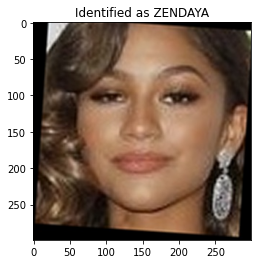

In [184]:
example_idx = 1196

example_image = load_image(metadata[test_idx][example_idx].image_path())
example_prediction = y_predict[example_idx]
example_identity =  y_predict_encoded[example_idx]

plt.imshow(example_image)
plt.title(f'Identified as {example_identity}');

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Import the the test image. Display the image. Use the SVM trained model to predict the face.

**Image 1 prediction**

Part 2 - Test Image - Dwayne Johnson4

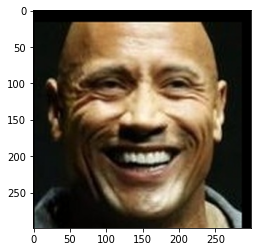

In [133]:
Predict_path1 = load_image('/content/gdrive/MyDrive/GL_Projects/Computer_Vision_2/Project2/Part 2 - Test Image - Dwayne Johnson4.jpg')

plt.imshow(Predict_path1)


In [196]:
pred_flat = (Predict_path1 / 255.).astype(np.float32)
pred_image1 = cv2.resize(pred_flat, dsize = (224,224))
print(pred_image1.shape)

(224, 224, 3)


In [197]:
test_embedding_vector = vgg_face_descriptor.predict(np.expand_dims(pred_image1, axis=0))[0]
print(test_embedding_vector.shape)

(2622,)


In [198]:

test_predict = []
test_predict.append(test_embedding_vector)
test_p = np.array(test_predict, dtype='float32')
test_p.shape

(1, 2622)

In [199]:
X_test_p_std = scaler.transform(test_p)
X_test_p_std.shape

(1, 2622)

In [200]:
pred_img1_pca = pca.transform(X_test_p_std)


In [201]:
pred_img1_output = clf.predict(pred_img1_pca)

In [202]:
Pred_img1_identity =  lencode.inverse_transform(pred_img1_output)

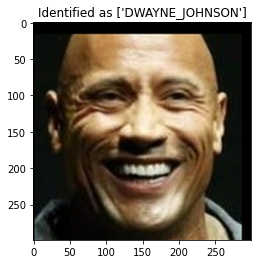

In [203]:
plt.imshow(Predict_path1)
plt.title(f'Identified as {Pred_img1_identity}');

**Image 2 prediction**

Part 2- Test Image - Benedict Cumberbatch9

(224, 224, 3)
(2622,)
['BENEDICT_CUMBERBATCH']


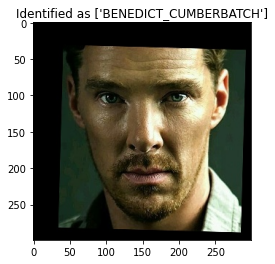

In [204]:
Predict_path2 = load_image('/content/gdrive/MyDrive/GL_Projects/Computer_Vision_2/Project2/Part 2- Test Image - Benedict Cumberbatch9.jpg')

plt.imshow(Predict_path2)

pred_flat = (Predict_path2 / 255.).astype(np.float32)
pred_image2 = cv2.resize(pred_flat, dsize = (224,224))
print(pred_image2.shape)

pred_emd_vec2 = vgg_face_descriptor.predict(np.expand_dims(pred_image2, axis=0))[0]
print(pred_emd_vec2.shape)


test_predict = []
test_predict.append(pred_emd_vec2)
test_p = np.array(test_predict, dtype='float32')
test_p.shape

X_test_p_std = scaler.transform(test_p)
X_test_p_std.shape

pred_img2_pca = pca.transform(X_test_p_std)

pred_img2_output = clf.predict(pred_img2_pca)

Pred_img2_identity =  lencode.inverse_transform(pred_img2_output)
print(Pred_img2_identity)

plt.imshow(Predict_path2)
plt.title(f'Identified as {Pred_img2_identity}');
